 ### Assignment 4: CLASSIFICATION - Decision Trees.


### Objective:
To build the Decision Tree model that predicts the signs_of_mental_illness of the victim from the Fatal Police Shooting Data and regularize the model and compare the performance.

### Fatal Police Shooting Data

### Objective:
To build the Decision Tree model that predicts the signs_of_mental_illness of the victim from the Fatal Police Shooting Data and regularize the model and compare the performance.

**About dataset**\
The dataset consists following columns
1. **id**                         : unqiue identifier of each victim
2. **name**                       : name of a victim
3. **date**                       : date on fatal shooting 
4. **manner_of_death**            : manner of death classification
    * Shot
    * Shot and Tasered
5. **armed**                      : indicates that the victim was armed with some sort of implement that a police officer believed could inflict harm
    * undetermined: it is not known whether or not the victim had a weapon
    * unknown: the victim was armed, but it is not known what the object was
    * unarmed: the victim was not armed
6. **age**                        : age of victim
7. **gender**                     : the gender of the victim. The Post identifies victims by the gender they identify with if reports indicate that it differs from their biological sex.
    * M: Male
    * F: Female
    * None: Unknown
8. **race**                       : race of victim
    * W: White, non-Hispanic
    * B: Black, non-Hispanic
    * A: Asian
    * N: Native American
    * H: Hispanic
    * O: Other
    * None: unknown
9. **city**                       : the municipality where the fatal shooting took place. Note that in some cases this field may contain a county name if a more specific municipality is unavailable or unknown.
10. **state**                     : two-letter postal code abbreviation
11. **signs_of_mental_illness**   : News reports have indicated the victim had a history of mental health issues, expressed suicidal intentions or was experiencing mental distress at the time of the shooting.
12. **threat_level**              : These would include incidents where officers or others were shot at, threatened with a gun, attacked with other weapons or physical force, etc. The attack category is meant to flag the highest level of threat. The other and undetermined categories represent all remaining cases. Other includes many incidents where officers or others faced significant threats. 
13. **flee**                      : News reports have indicated the victim was moving away from officers
    * Foot
    * Car
    * Not fleeing
14. **body_camera**               : News reports have indicated an officer was wearing a body camera and it may have recorded some portion of the incident.

### Import all neccessary libraries

In [1]:
# Standard library
import copy
import warnings
from os import system

# Third-party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image

# Scikit-learn
from sklearn import preprocessing, metrics, tree
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    classification_report,
    accuracy_score,
    precision_score,
    recall_score
)

# Jupyter magic (must be last in cell)
%matplotlib inline

# Silence warnings
warnings.filterwarnings("ignore")

### Let's import the data

In [2]:
police = pd.read_csv('Dataset/fatal-police-shootings-data.csv')
police.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False


### Let's Understand the data

In [3]:
police.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4478 entries, 0 to 4477
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       4478 non-null   int64  
 1   name                     4478 non-null   object 
 2   date                     4478 non-null   object 
 3   manner_of_death          4478 non-null   object 
 4   armed                    4230 non-null   object 
 5   age                      4309 non-null   float64
 6   gender                   4473 non-null   object 
 7   race                     4105 non-null   object 
 8   city                     4478 non-null   object 
 9   state                    4478 non-null   object 
 10  signs_of_mental_illness  4478 non-null   bool   
 11  threat_level             4478 non-null   object 
 12  flee                     4299 non-null   object 
 13  body_camera              4478 non-null   bool   
dtypes: bool(2), float64(1), 

In [4]:
police.describe()

,id,age
count,4478.000000,4309.000000
mean,2502.721974,36.879322
std,1404.978671,13.067598
min,3.000000,6.000000
25%,1286.250000,27.000000
50%,2505.500000,35.000000
75%,3718.750000,45.000000
max,4927.000000,91.000000


In [5]:
police.describe(include='object').T

,count,unique,top,freq
name,4478,4332,TK TK,129
date,4478,1551,2018-02-01,9
manner_of_death,4478,2,shot,4250
armed,4230,84,gun,2489
gender,4473,2,M,4265
race,4105,6,W,2059
city,4478,2168,Phoenix,68
state,4478,51,CA,680
threat_level,4478,3,attack,2829
flee,4299,4,Not fleeing,2868


### Question 1: 1 Mark
**Display the percentage of missing values present in each column of the data and round it off to 2 decimal place.**

In [6]:
round((police.isnull().sum() / police.count() * 100), 2)

id                         0.00
name                       0.00
date                       0.00
manner_of_death            0.00
armed                      5.86
age                        3.92
gender                     0.11
race                       9.09
city                       0.00
state                      0.00
signs_of_mental_illness    0.00
threat_level               0.00
flee                       4.16
body_camera                0.00
dtype: float64

In [7]:
# So,how many total missing values do we have?
total_cells = np.prod(police.shape)
total_missing = police.isnull().sum().sum()

# percent of data that is missing
percent_missing = (total_missing/total_cells) * 100
print(percent_missing)

1.5536272570662923


### Let's clean the data

In [8]:
# Since we observe only 1.6% of null or missing values, let's drop those missing values.

# Remove all the rows that contain missing value
police = police.dropna()

In [9]:
police.isnull().sum()

id                         0
name                       0
date                       0
manner_of_death            0
armed                      0
age                        0
gender                     0
race                       0
city                       0
state                      0
signs_of_mental_illness    0
threat_level               0
flee                       0
body_camera                0
dtype: int64

In [10]:
# Drop redundant or not so useful columns for model building
police = police.drop(['id','date','city','name','state'], axis=1)

In [11]:
# We take a copy of our source data.
df = copy.deepcopy(police)
df.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera
0,shot,gun,53.0,M,A,True,attack,Not fleeing,False
1,shot,gun,47.0,M,W,False,attack,Not fleeing,False
2,shot and Tasered,unarmed,23.0,M,H,False,other,Not fleeing,False
3,shot,toy weapon,32.0,M,W,True,attack,Not fleeing,False
4,shot,nail gun,39.0,M,H,False,attack,Not fleeing,False


### Encoding

### Question 2: 1 Mark

- convert the body_camera column to binary numbers. False = 0 and True = 1. Convert it's datatype to int.
- convert the gender column to binary numbers. Male = 1 and Female = 0. Convert it's datatype to int.
- convert the signs_of_mental_illness column to binary numbers. False = 0 and True = 1. Convert it's datatype to int.
- convert the manner_of_death column to binary numbers. shot = 0 and shot and Tasered = 1. Convert it's datatype to int.

In [12]:
le = preprocessing.LabelEncoder()    # using label encoder class in the object le, 
                                      # convert the following values of these attributes to integer datattype values

# use appropriate methods from LabelEncoder class to transform the following into into binary nos

df["body_camera"]= le.fit_transform(df["body_camera"])
df["gender"]= le.fit_transform(df["gender"])
df["signs_of_mental_illness"]= le.fit_transform(df["signs_of_mental_illness"])
df["manner_of_death"]= le.fit_transform(df['manner_of_death'])


df['manner_of_death'] = df['manner_of_death'].astype('int')

# convert the following into int datatype

df['gender'] = df['gender'].astype(int)
df['signs_of_mental_illness'] = df['signs_of_mental_illness'].astype(int)
df['body_camera'] = df['body_camera'].astype(int)

In [13]:
df.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera
0,0,gun,53.0,1,A,1,attack,Not fleeing,0
1,0,gun,47.0,1,W,0,attack,Not fleeing,0
2,1,unarmed,23.0,1,H,0,other,Not fleeing,0
3,0,toy weapon,32.0,1,W,1,attack,Not fleeing,0
4,0,nail gun,39.0,1,H,0,attack,Not fleeing,0


In [14]:
# Decision tree in Python can take only numerical / categorical columns. It cannot take string / object types. 
# The following code loops through each column and checks if the column type is object then converts those columns
# into categorical with each distinct value becoming a category or code.


for feature in df.columns: # Loop through all columns in the dataframe
    if df[feature].dtype == 'object': # Only apply for columns with categorical strings
        df[feature] = pd.Categorical(df[feature]).codes # Replace strings with an integer

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3663 entries, 0 to 4477
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   manner_of_death          3663 non-null   int64  
 1   armed                    3663 non-null   int8   
 2   age                      3663 non-null   float64
 3   gender                   3663 non-null   int64  
 4   race                     3663 non-null   int8   
 5   signs_of_mental_illness  3663 non-null   int64  
 6   threat_level             3663 non-null   int8   
 7   flee                     3663 non-null   int8   
 8   body_camera              3663 non-null   int64  
dtypes: float64(1), int64(4), int8(4)
memory usage: 186.0 KB


In [16]:
df.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera
0,0,30,53.0,1,0,1,0,2,0
1,0,30,47.0,1,5,0,0,2,0
2,1,75,23.0,1,2,0,1,2,0
3,0,74,32.0,1,5,1,0,2,0
4,0,53,39.0,1,2,0,0,2,0


### Let's build our models

**We are going to build a Decision Tree model. In this model we are going to predict signs_of_mental_illness.**

### Question 3: 1 Mark

**Split the Independent and Dependent attributes seperately from the given datset and save those in X and y variables respectively.**

In [17]:
X = df.drop(columns=['signs_of_mental_illness']) # Independent attributes
y = df['signs_of_mental_illness']  # Dependent attribute

In [18]:
train_char_label = ['No', 'Yes']

### Question 4: 1 Mark
Split the data into train and test, with a train, test ratio of 80:20

In [19]:
X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size=0.2, random_state=42)


### Question 5: 1 Mark
**Build a decision tree model using appropriate  class from sklearn library and fit that model on train data.**

In [20]:
dt_model = DecisionTreeClassifier(criterion = 'entropy' ) 
dt_model.fit(X_train, y_train)

,criterion,'entropy'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


### Question 6: 1 Mark
**Predict the above built model on test data.**

In [21]:
y_predict = dt_model.predict(X_test)

In [22]:
print(dt_model.score(X_train , y_train))
print(dt_model.score(X_test , y_test))

0.8955631399317406
0.7053206002728513


# Question 7: 1 Mark

Print confusion matrix of test data

In [23]:
from sklearn.metrics import confusion_matrix

print(confusion_matrix(y_test, y_predict)) # display a confusion matrix of test data using approriate class from sklearn library

[[476  63]
 [153  41]]


In [24]:
from IPython.display import Image  
#import pydotplus as pydot
from sklearn import tree
from os import system

decision_tree = open('decision_tree.dot','w')
dot_data = tree.export_graphviz(dt_model, out_file= decision_tree , feature_names = list(X_train), class_names = list(train_char_label))

decision_tree.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                      Imp
manner_of_death  0.030342
armed            0.129099
age              0.493077
gender           0.036210
race             0.093631
threat_level     0.083291
flee             0.084421
body_camera      0.049929


In [25]:
# Convert .dot to .png using Graphviz to display the Tree
system("dot -Tpng decision_tree.dot -o decision_tree.png")

# Display inside Jupyter
Image("decision_tree.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.991737 to fit


**We can see that tree is overgrown**

## Regularising (pruning) the Decision Tree

### Question 8: 1 Mark
**Build a pruned decision tree classifier model with criterion=entropy, max_depth=6, min_samples_split=3, min_samples_leaf=1 and fit it on train data.**

In [26]:
reg_dt_model = DecisionTreeClassifier(criterion='entropy', 
                                      max_depth=6,             # Apply hyperparameters and build a decision tree model
                                      min_samples_split=3, 
                                      min_samples_leaf=1)    

reg_dt_model.fit(X_train, y_train)   # Fit your train data here

,criterion,'entropy'
,splitter,'best'
,max_depth,6
,min_samples_split,3
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [27]:
credit_tree_regularized = open('credit_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

### Question 9: 1 Mark
**Display the feature importance of all the predictors from regularized or pruned decision tree model.**

In [28]:
'''Print the feature importances of all the Independendent variables or predictors to know
 which attribute has contibuted most in predition.'''

# Get feature names and importances
feature_names = X_train.columns
importances = reg_dt_model.feature_importances_

# Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame()
feature_importance_df['Feature'] = feature_names
feature_importance_df['Importance'] = importances

# Print feature importances of all the independent variables (X)
print(feature_importance_df)

           Feature  Importance
0  manner_of_death    0.013521
1            armed    0.236605
2              age    0.132614
3           gender    0.051461
4             race    0.134381
5     threat_level    0.061319
6             flee    0.337855
7      body_camera    0.032243


In [29]:
y_predict = reg_dt_model.predict(X_test)

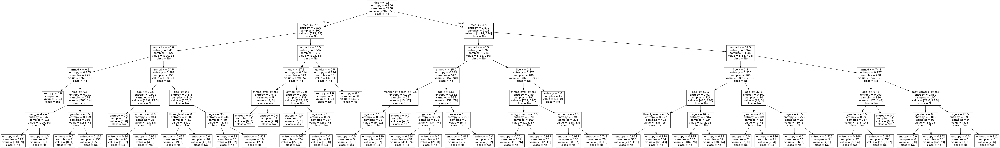

In [30]:
# Convert .dot to .png using Graphviz to display the Tree

system("dot -Tpng credit_tree_regularized.dot -o credit_tree_regularized.png")
Image("credit_tree_regularized.png")

### Question 10: 1 Mark
**Check the accuracy of both train and test data of regularized decision tree model.**

In [31]:
print(reg_dt_model.score(X_train, y_train)) # Display the accuracy of train data using the appropriate method
print(reg_dt_model.score(X_test, y_test))  # Display the accuracy of test data using the appropriate method


0.7627986348122867
0.7244201909959073


In [32]:
print(metrics.confusion_matrix(y_test, y_predict))

[[526  13]
 [189   5]]


#### Though accuracy reduced in train, we can observe that model is a good model without overfitting and underfitting. Also accuracy of test data increased.